This notebook's purpose is to be a sandbox for playing with and learning how to use various image recognition and computer vision tools. I'll start with some sections will follow [pyimagelearning tutorials](https://www.pyimagesearch.com/2016/02/08/opencv-shape-detection/).

In [340]:
# core
import sys, os, re, argparse
import numpy as np
import pandas as pd
from glob import glob
# plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Image
# image recognition
import cv2
import imutils
import PIL.Image
from pytesseract import image_to_string
import pytesseract

In [52]:
class Vividict(dict):
    def __missing__(self, key):
        value = self[key] = type(self)() # retain local pointer to value
        return value                     # faster to return than dict lookup

## OpenCV center of contour
Here is the `shapes_and_colors.jpg` image I'll be working with.

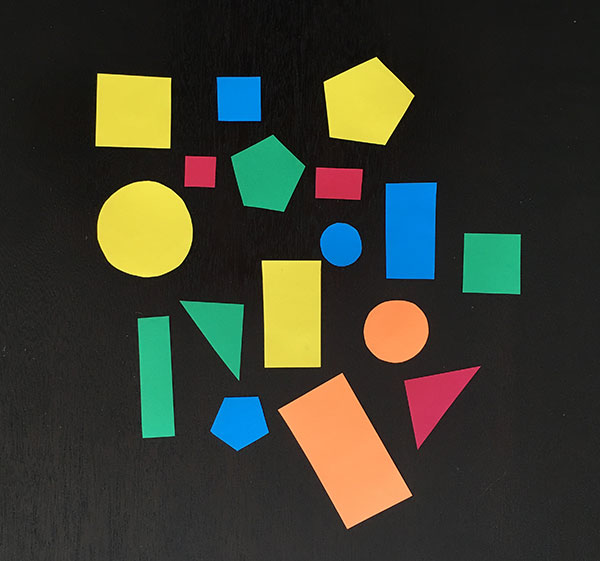

In [2]:
Image(filename="../Data/sandbox_data/shapes_and_colors.jpg", width=500)

**Goals**
1. detect the outline of each shape in the image
2. compute the center of the contour — also called the centroid of the region.

**Steps**
1. Convert to grayscale.
2. Blur to reduce high frequency noise to make our contour detection process more accurate.
3. Binarize of the image. Typically edge detection and thresholding are used for this process.

In [3]:
image = cv2.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")
# image = cv2.imread(filename="../Data/C3_images/33.1_10x_D.jpg")
shapes = cv2.imread("../Data/sandbox_data/shapes_and_colors.jpg")

grayshapes = cv2.cvtColor(shapes, cv2.COLOR_BGR2GRAY)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

blurredshapes = cv2.GaussianBlur(grayshapes, (5, 5), 0)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

threshshapes = cv2.threshold(src=blurredshapes, thresh=60, maxval=255, type=cv2.THRESH_BINARY)[1]
thresh = cv2.threshold(src=blurred, thresh=60, maxval=255, type=cv2.THRESH_BINARY)[1]

C, blocksize = 2, 5

MAthresh = cv2.adaptiveThreshold(src=blurredshapes, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
MAthresh = cv2.adaptiveThreshold(src=blurred, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

GAthresh = cv2.adaptiveThreshold(src=blurredshapes, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
GAthresh = cv2.adaptiveThreshold(src=blurred, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)

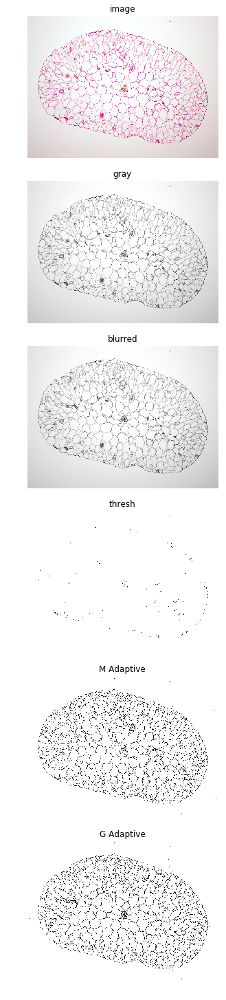

In [4]:
images = [image, gray, blurred, thresh, MAthresh, GAthresh]
titles = ["image", "gray", "blurred", "thresh", "M Adaptive", "G Adaptive"]

fig, ax = plt.subplots(nrows=len(images), ncols=1, figsize=(20, 20))

for i, title in enumerate(titles):
    ax[i].imshow(images[i], vmin=0, vmax=255, cmap="gray")
    ax[i].axis('off')
    ax[i].set_title(titles[i])
    
plt.tight_layout(pad=0.0, h_pad=0.0, w_pad=-2.0)

Now to get the contours and plot.

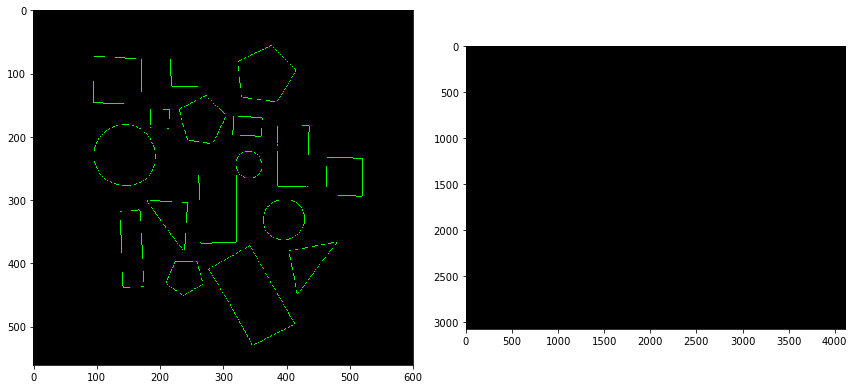

In [5]:
contoursshapes = cv2.findContours(threshshapes.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contoursshapes = imutils.grab_contours(contoursshapes)

contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = imutils.grab_contours(contours)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
canvasshapes = np.zeros_like(shapes)
cv2.drawContours(canvasshapes, contoursshapes, -1, (0, 255, 0), 1)
ax[0].imshow(canvasshapes)

canvas = np.zeros_like(image)
cv2.drawContours(canvas, contours, -1, (0, 255, 0), 1)
ax[1].imshow(canvas)
plt.tight_layout()

**Code below will take a long time to run with current image. Use with shape image only**

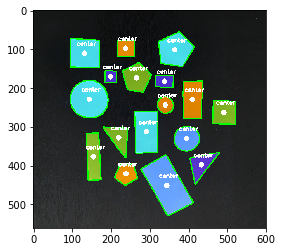

In [6]:
MIN_THRESH = 1
# loop over the contours
for c in contoursshapes:
    if cv2.contourArea(c) > MIN_THRESH:
        # process the contour
        # compute the center of the contour
        M = cv2.moments(c)
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])

        # draw the contour and center of the shape on the image
        cv2.drawContours(shapes, [c], -1, (0, 255, 0), 2)
        cv2.circle(shapes, (cX, cY), 7, (255, 255, 255), -1)
        cv2.putText(shapes, "center", (cX - 20, cY - 20),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        # show the image
        plt.imshow(shapes)

Now trying to follow [this post](https://stackoverflow.com/questions/46036172/irregular-shape-detection-and-measurement-in-python-opencv).

Some notes on HSV

- **H**ue is the color portion of the color model, expressed as a number from 0 to 360 degrees:
 - Red	0–60
 - Yellow	60-–20
 - Green	120–180
 - Cyan	180–240
 - Blue	240–300
 - Magenta	300–360
 
- **S**aturation is the amount of gray in the color, from 0 to 100 percent. Reducing the saturation toward zero to introduce more gray produces a faded effect. Sometimes, saturation is expressed in a range from just 0-1, where 0 is gray and 1 is a primary color.

- **V**alue (or Brightness) works in conjunction with saturation and describes the brightness or intensity of the color, from 0-100 percent, where 0 is completely black, and 100 is the brightest and reveals the most color.

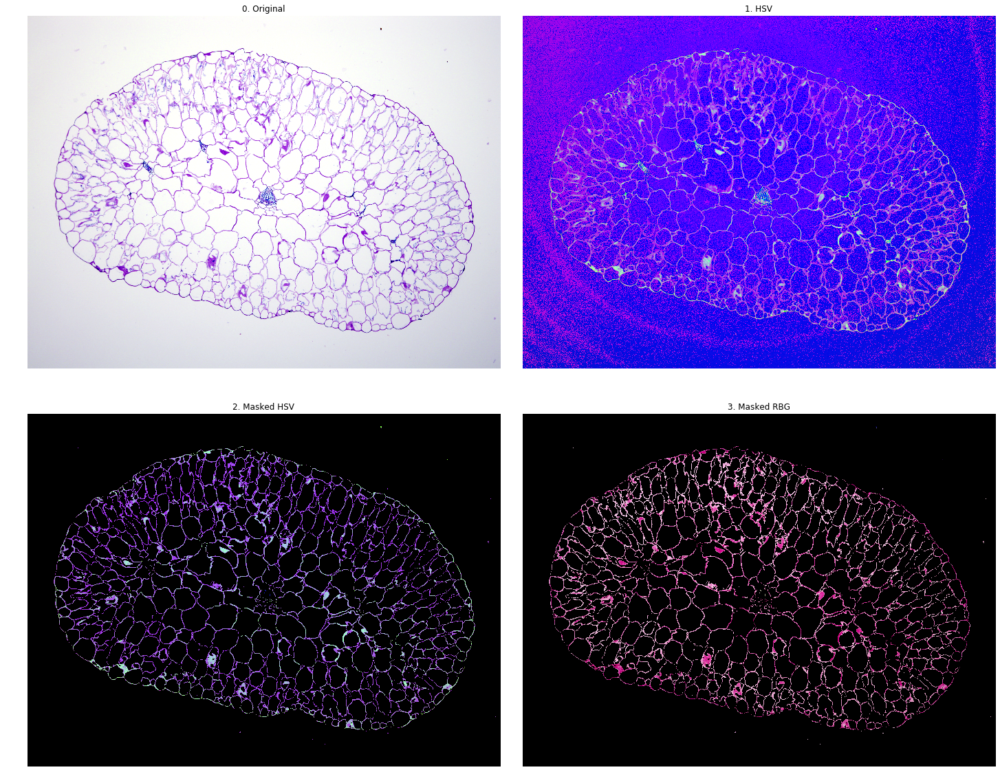

In [7]:
image = cv2.imread("../Data/Calindrinia/C_spergularina_lph133_A16_LD_1778_14_step2.tif")

height, width = image.shape[:2]
# Convert to BGR, which is standard for openCV
BGR = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# Convert to HSV for selecting channels
HSV = cv2.cvtColor(BGR.copy(), cv2.COLOR_BGR2HSV)
# Mask channel values
mask = cv2.inRange(src=HSV.copy(), lowerb=np.array([30,30,30]), upperb=np.array([165,255,255]))
masked=cv2.bitwise_and(src1=HSV.copy(), src2=HSV.copy(), mask=mask)
# Convert back to RGB
RGB=cv2.cvtColor(src=masked.copy(), code=cv2.COLOR_HSV2RGB)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,20))
ax[0,0].imshow(BGR)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(HSV)
ax[0,1].set_title("1. HSV")

ax[1,0].imshow(masked)
ax[1,0].set_title("2. Masked HSV")

ax[1,1].imshow(RGB)
ax[1,1].set_title("3. Masked RBG")

for i in range(2): 
    for j in range(2):
        ax[i,j].axis("off")
    
plt.tight_layout(pad=0.0, h_pad=-20.0)

Currently I'm having better results using the original image instead of the masked HSV. Not exactly sure why, since the features seem more distinction on the HSV.

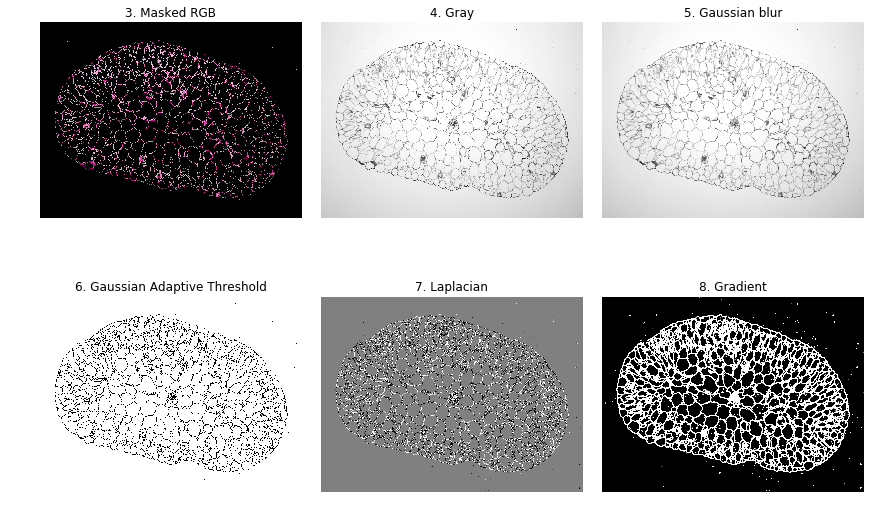

In [8]:
# image = cv2.imread(filename="../Data/C3_images/33.1_10x_D.jpg")
"""Gray"""
gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)

# Kernel size for blurring in pizels
k_blur = 9
"""Blur"""
blur = cv2.GaussianBlur(src=gray, ksize=(k_blur, k_blur), sigmaX=2)
# edged = cv2.Canny(blur, threshold1 = 0, threshold2=100)
# dilate = cv2.dilate(edged, None, iterations=1)
# Constant subtracted from the mean or weighted mean
C = 3
# Neighborhood size in pixel for calculating threshold
blocksize = 15
"""Adaptive Gaussian threshold"""
thresh = cv2.adaptiveThreshold(src=blur, maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
"""Laplacian"""
k_laplacian = 7
laplacian = cv2.Laplacian(src=thresh, ddepth=cv2.CV_16S, ksize=k_laplacian)

"""Morphological gradient"""
# Kernel size for blurring in pizels
k_gradient = 3
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
gradient = cv2.morphologyEx(laplacian, cv2.MORPH_GRADIENT, kernel=kernel, iterations=3)

# Plotting
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,8))
ax[0,0].imshow(RGB)
ax[0,0].set_title("3. Masked RGB")

ax[0,1].imshow(gray, cmap="gray")
ax[0,1].set_title("4. Gray")

ax[0,2].imshow(blur, cmap="gray")
ax[0,2].set_title("5. Gaussian blur")

ax[1,0].imshow(thresh, cmap="gray")
ax[1,0].set_title("6. Gaussian Adaptive Threshold")

ax[1,1].imshow(laplacian, cmap="gray")
ax[1,1].set_title("7. Laplacian")

ax[1,2].imshow(gradient, cmap="gray")
ax[1,2].set_title("8. Gradient")

for i in range(2):
    for j in range(3):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-1.0, w_pad=-2.0)

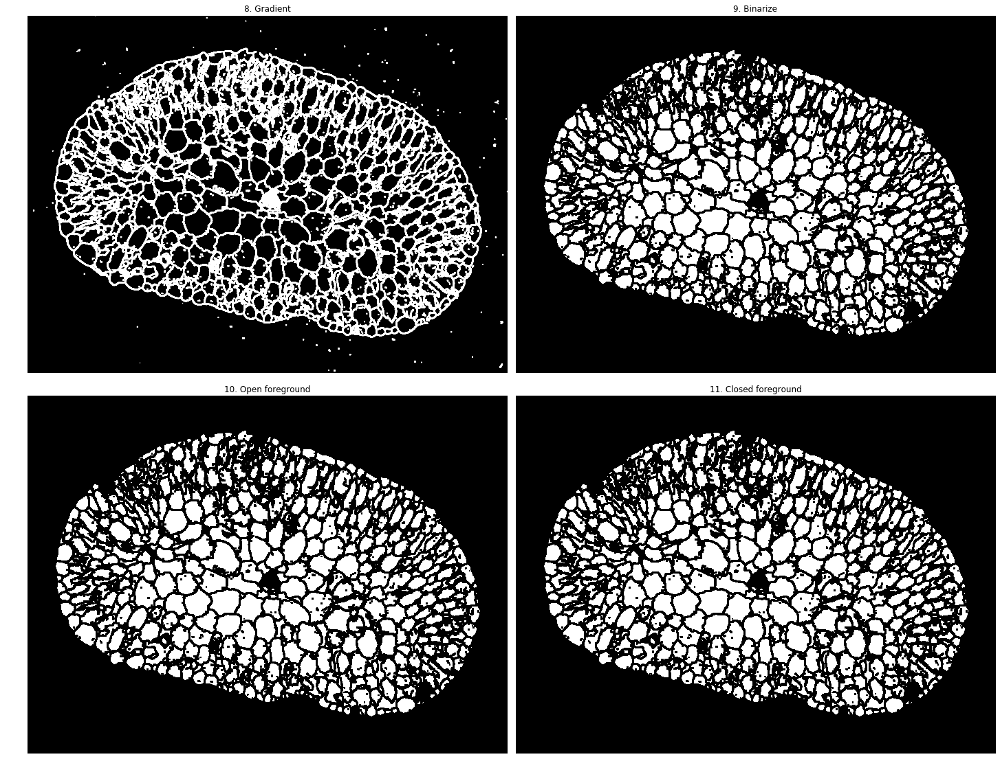

In [9]:
"""Binarize gradient"""
binary = cv2.inRange(gradient, lowerb=np.array([0]), upperb=np.array([5]))

"""Flood fill from the edges"""
for row in range(height):
    if binary[row, 0] == 255:
        cv2.floodFill(binary, None, (0, row), 0)
    if binary[row, width-1] == 255:
        cv2.floodFill(binary, None, (width-1, row), 0)

for col in range(width):
    if binary[0, col] == 255:
        cv2.floodFill(binary, None, (col, 0), 0)
    if binary[height-1, col] == 255:
        cv2.floodFill(binary, None, (col, height-1), 0)

"""Cleaning up mask"""
foreground_open = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel=kernel, iterations=1)
foreground_closed = cv2.morphologyEx(foreground_open, cv2.MORPH_CLOSE, kernel=kernel, iterations=1)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,20))
ax[0,0].imshow(gradient, cmap="gray")
ax[0,0].set_title("8. Gradient")

ax[0,1].imshow(binary, cmap="gray")
ax[0,1].set_title("9. Binarize")

ax[1,0].imshow(foreground_open, cmap="gray")
ax[1,0].set_title("10. Open foreground")

ax[1,1].imshow(foreground_closed, cmap="gray")
ax[1,1].set_title("11. Closed foreground")

for i in range(2):
    for j in range(2):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-25.0, w_pad=-2.0)

I tried using `mode=cv2.RETR_TREE` instead of `cv2.RETR_EXTERNAL`, below, but it includes many more small contours within larger contours. This method works much better compared to other `cv2.RET_*` modes.

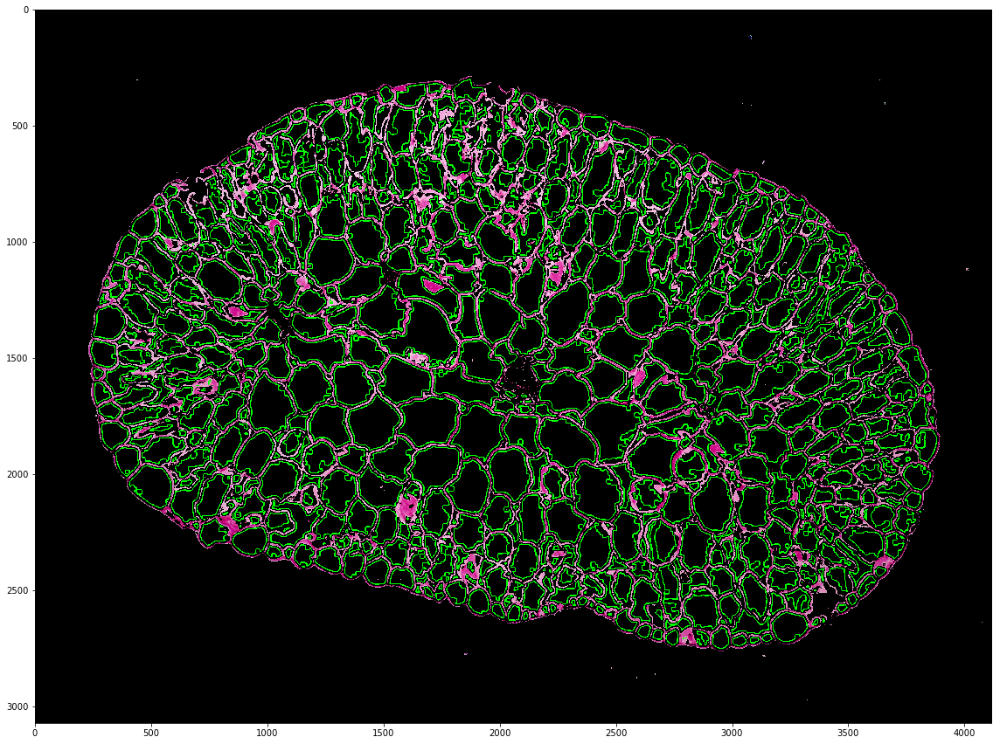

In [10]:
contours, hierarchy = cv2.findContours(image=foreground_closed, mode=cv2.RETR_EXTERNAL, 
                                       method=cv2.CHAIN_APPROX_SIMPLE)

fig, ax = plt.subplots(figsize=(16,16))
drawn_contours = cv2.drawContours(image=RGB.copy(), contours=contours, 
                                  contourIdx=-1, color=(0,255,0), thickness=3)
plt.imshow(drawn_contours, )
plt.tight_layout()

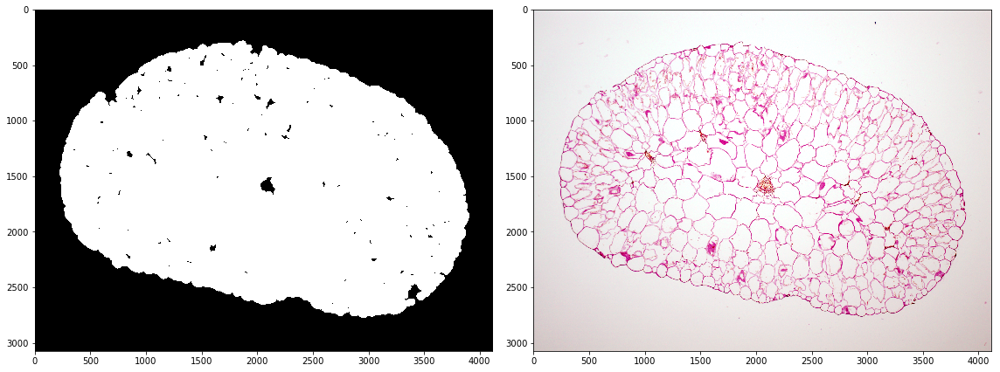

In [11]:
"""Creating background and unknown mask for labeling"""
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17, 17))
background = cv2.dilate(foreground_closed, kernel, iterations=3)
unknown = cv2.subtract(background, foreground_closed)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
ax[0].imshow(background, cmap="gray")
ax[1].imshow(image)
plt.tight_layout()

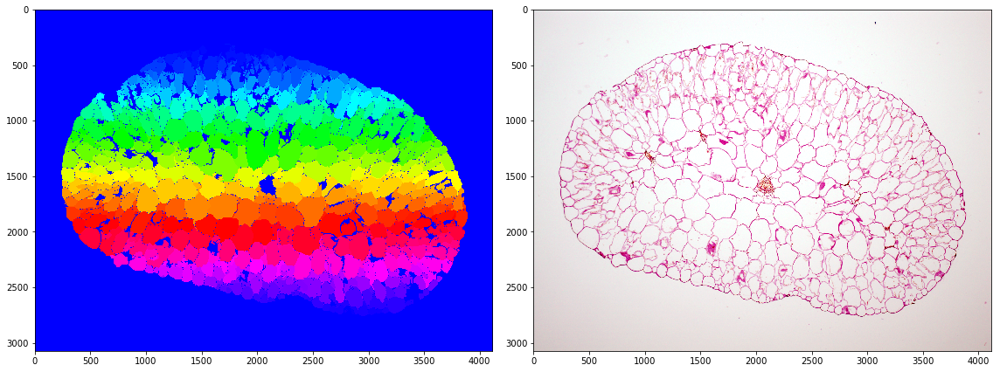

In [12]:
"""Watershed"""
markers = cv2.connectedComponents(foreground_closed)[1]
markers += 1  # Add one to all labels so that background is 1, not 0
markers[unknown==255] = 0  # mark the region of unknown with zero
markers = cv2.watershed(image, markers)

"""Assign the markers a hue between 0 and 179"""

hue_markers = np.uint8(179*np.float32(markers)/np.max(markers))
blank_channel = 255*np.ones((height, width), dtype=np.uint8)
marker_img = cv2.merge([hue_markers, blank_channel, blank_channel])
marker_img = cv2.cvtColor(marker_img, cv2.COLOR_HSV2BGR)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,16))
ax[0].imshow(marker_img, cmap="gray")
ax[1].imshow(image)
plt.tight_layout()

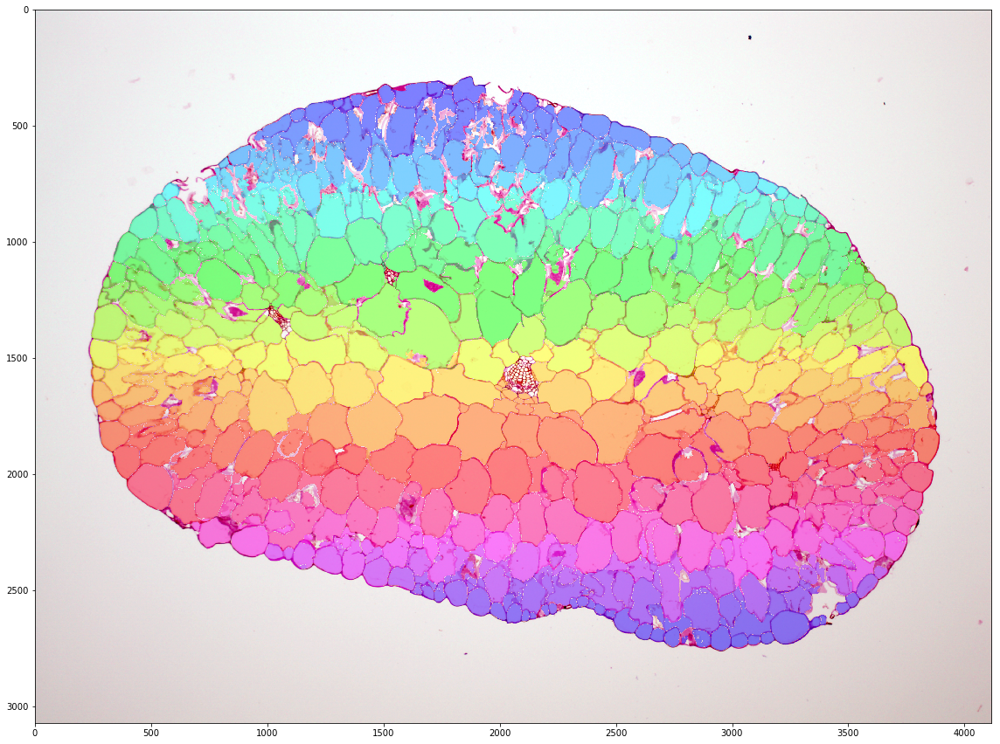

In [13]:
"""Label the original image with the watershed markers"""
labeled_img = image.copy()
labeled_img[markers>1] = marker_img[markers>1]  # 1 is background color
labeled_img = cv2.addWeighted(image, 0.5, labeled_img, 0.5, 0)

fig, ax = plt.subplots(figsize=(16,16))
ax.imshow(labeled_img)
plt.tight_layout()

In [14]:
careas = [cv2.contourArea(c) for c in contours]
print(len(careas), np.argmax(careas))

884 512


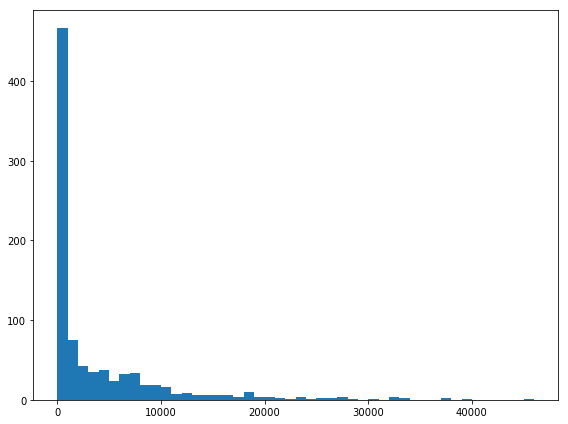

In [15]:
fig, ax = plt.subplots(figsize=(8,6))

binwidth=1000

plt.hist(careas, bins=range(int(min(careas)), int(max(careas)) + binwidth, binwidth))

plt.tight_layout()

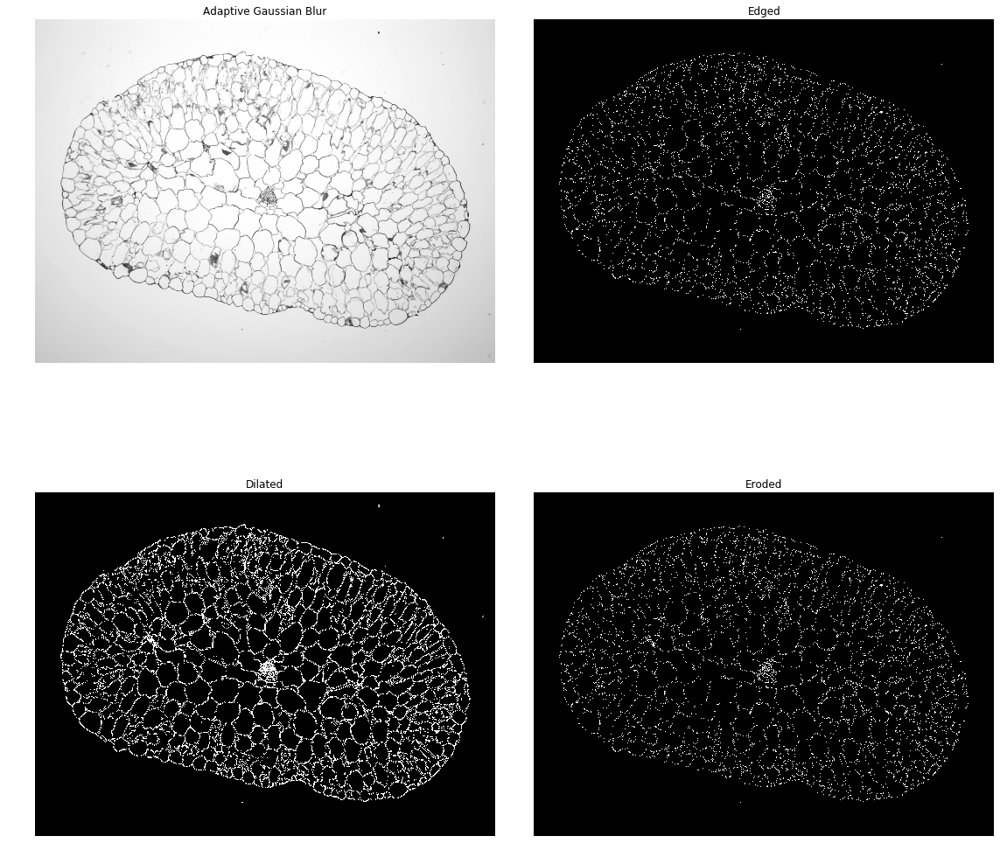

In [16]:
edged = cv2.Canny(blur, threshold1 = 50, threshold2=100)
dilate = cv2.dilate(edged, None, iterations=1)
erode = cv2.erode(dilate, None, iterations=1)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,16))
ax[0,0].imshow(blur, cmap="gray")
ax[0,0].set_title("Adaptive Gaussian Blur")

ax[0,1].imshow(edged, cmap="gray")
ax[0,1].set_title("Edged")

ax[1,0].imshow(dilate, cmap="gray")
ax[1,0].set_title("Dilated")

ax[1,1].imshow(erode, cmap="gray")
ax[1,1].set_title("Eroded")

for i in range(2):
    for j in range(2):
        ax[i,j].axis("off")

plt.tight_layout()

I haven't been able to use HSV image processing to improve the contour drawing as of now. One issue is that the `cv2.inRange` function is _inclusive_ not _exclusive_. So later on I'll try to merge two images that capture disparate, informative regions of HSV. The next code block can be temporarily ignored.

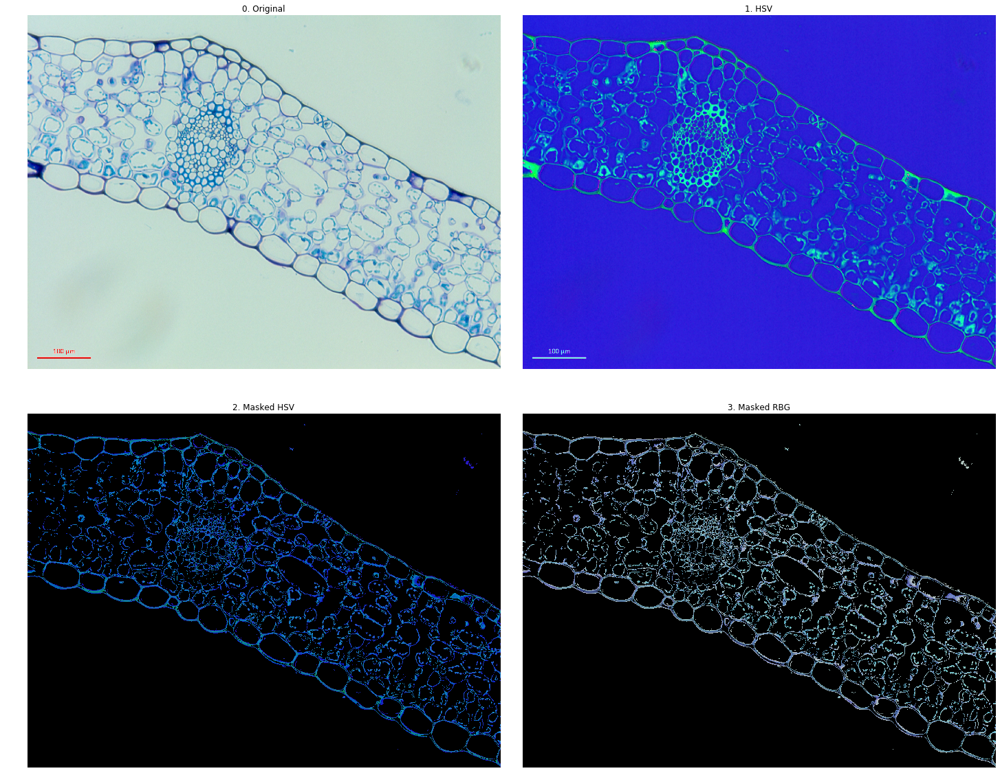

In [339]:
height, width = image.shape[:2]
# Convert to BGR, which is standard for openCV
BGR = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
# Convert to HSV for selecting channels
HSV = cv2.cvtColor(BGR.copy(), cv2.COLOR_BGR2HSV)
# Mask channel values
old_mask = cv2.inRange(src=HSV.copy(), lowerb=np.array([0, 0, 0]), upperb=np.array([50, 150, 200]))
old_masked=cv2.bitwise_and(src1=HSV.copy(), src2=HSV.copy(), mask=old_mask)

new_mask = cv2.inRange(src=HSV.copy(), lowerb=np.array([0, 0, 0]), upperb=np.array([50, 150, 200]))
new_masked=cv2.bitwise_and(src1=HSV.copy(), src2=HSV.copy(), mask=new_mask)
# Convert back to RGB
RGB=cv2.cvtColor(src=new_masked.copy(), code=cv2.COLOR_HSV2BGR)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,20))
ax[0,0].imshow(BGR)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(HSV)
ax[0,1].set_title("1. HSV")

ax[1,0].imshow(new_masked)
ax[1,0].set_title("2. Masked HSV")

ax[1,1].imshow(RGB)
ax[1,1].set_title("3. Masked RBG")

for i in range(2): 
    for j in range(2):
        ax[i,j].axis("off")
    
plt.tight_layout(pad=0.0, h_pad=-20.0)

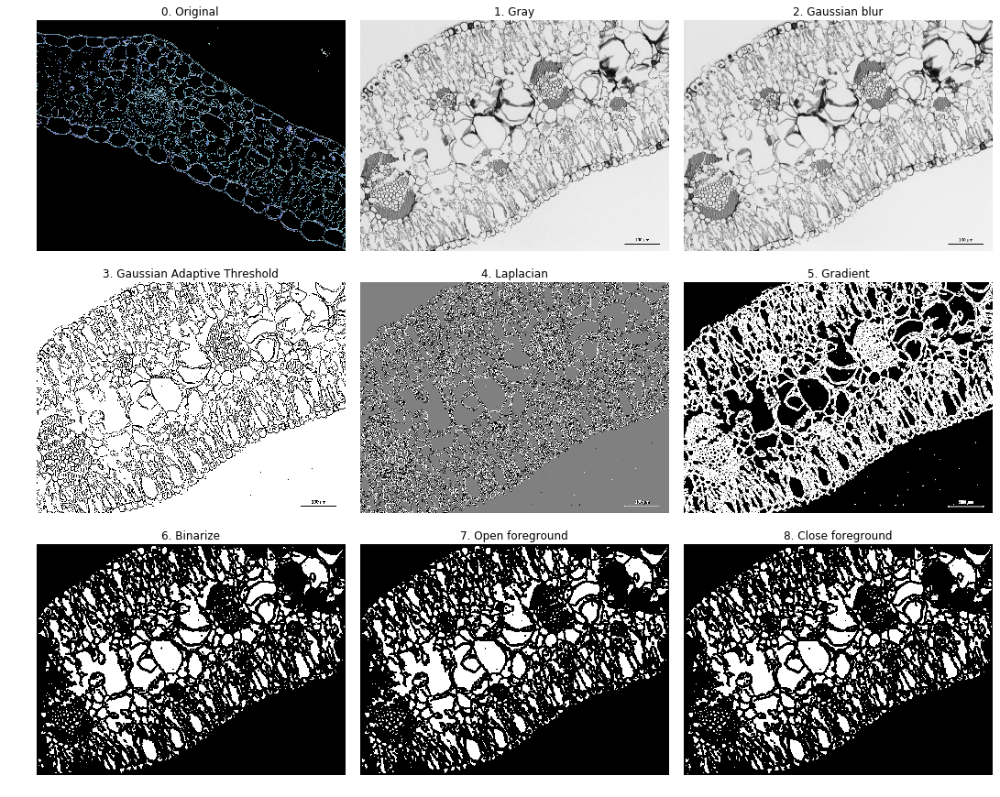

In [506]:
"""0. Original"""
image_dir = "../Data/C3_images/"
image_paths = glob(os.path.join("../Data/C3_images/", "*.jpg"))
image_path="../Data/C3_images/25.1_10x.jpg"
image = cv2.imread(image_path)
height, width = image.shape[:2]

"""Convert to BGR"""
BGR = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2BGR)

"""1. Gray"""
gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)

"""2. Blur"""
# Kernel size for blurring in pizels
k_blur = 5
blur = cv2.GaussianBlur(src=gray.copy(), ksize=(k_blur, k_blur), sigmaX=2, sigmaY=2)
# edged = cv2.Canny(blur, threshold1 = 0, threshold2=100)
# dilate = cv2.dilate(edged, None, iterations=1)

"""3. Adaptive Gaussian threshold"""
# Constant subtracted from the mean or weighted mean
C = 3
# Neighborhood size in pixel for calculating threshold
blocksize = 15
thresh = cv2.adaptiveThreshold(src=blur.copy(), maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               thresholdType=cv2.THRESH_BINARY, blockSize=blocksize, C=C)
"""4. Laplacian"""
k_laplacian = 7
laplacian = cv2.Laplacian(src=thresh.copy(), ddepth=cv2.CV_16S, ksize=k_laplacian)

"""5. Morphological gradient"""
# Kernel size for blurring in pizels
k_gradient = 2
kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
gradient = cv2.morphologyEx(laplacian.copy(), cv2.MORPH_GRADIENT, kernel=kernel, iterations=3)

"""6. Binarize gradient"""
binary = cv2.inRange(gradient.copy(), lowerb=np.array([0]), upperb=np.array([5]))

"""Flood fill from the edges"""
for row in range(height):
    if binary[row, 0] == 255:
        cv2.floodFill(binary, None, (0, row), 0)
    if binary[row, width-1] == 255:
        cv2.floodFill(binary, None, (width-1, row), 0)

for col in range(width):
    if binary[0, col] == 255:
        cv2.floodFill(binary, None, (col, 0), 0)
    if binary[height-1, col] == 255:
        cv2.floodFill(binary, None, (col, height-1), 0)

"""7. Cleaning up mask: open forereground"""
foreground_open = cv2.morphologyEx(binary.copy(), cv2.MORPH_OPEN, kernel=kernel, iterations=1)
"""8. Cleaning up mask: close forereground"""
foreground_closed = cv2.morphologyEx(foreground_open.copy(), cv2.MORPH_CLOSE, kernel=kernel, iterations=1)

# Plotting
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15,15))
ax[0,0].imshow(RGB)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(gray, cmap="gray")
ax[0,1].set_title("1. Gray")

ax[0,2].imshow(blur, cmap="gray")
ax[0,2].set_title("2. Gaussian blur")

ax[1,0].imshow(thresh, cmap="gray")
ax[1,0].set_title("3. Gaussian Adaptive Threshold")

ax[1,1].imshow(laplacian, cmap="gray")
ax[1,1].set_title("4. Laplacian")

ax[1,2].imshow(gradient, cmap="gray")
ax[1,2].set_title("5. Gradient")

ax[2,0].imshow(binary, cmap="gray")
ax[2,0].set_title("6. Binarize")

ax[2,1].imshow(foreground_open, cmap="gray")
ax[2,1].set_title("7. Open foreground")

ax[2,2].imshow(foreground_closed, cmap="gray")
ax[2,2].set_title("8. Close foreground")

for i in range(3):
    for j in range(3):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-20.0, w_pad=-2.0)

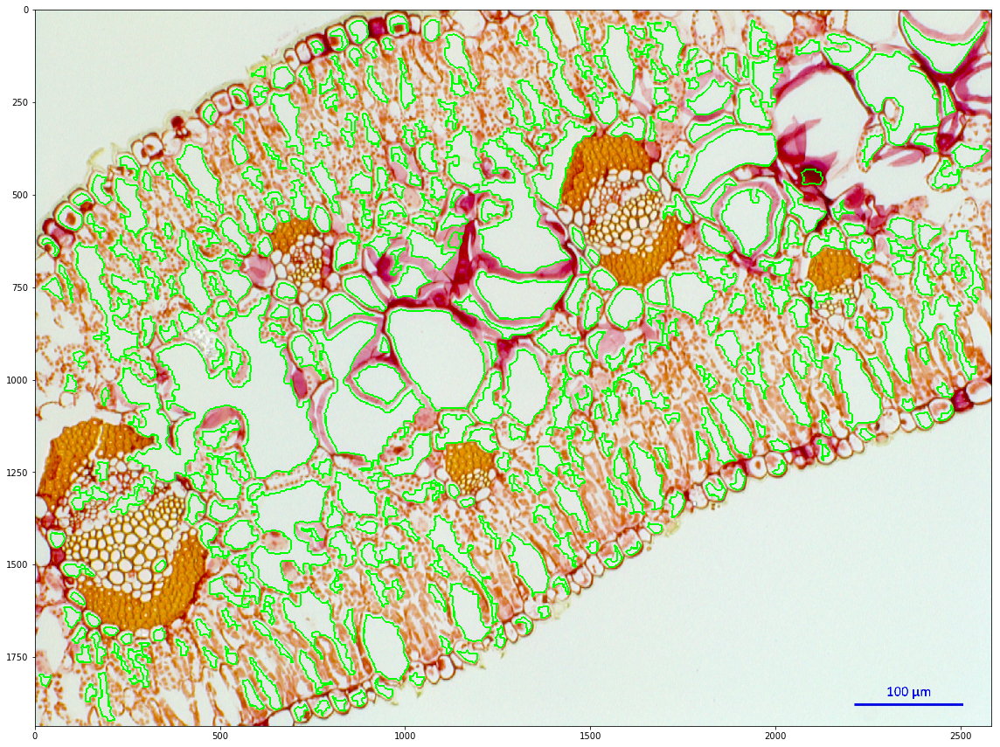

In [507]:
contours, hierarchy = cv2.findContours(image=foreground_closed.copy(), mode=cv2.RETR_EXTERNAL, 
                                       method=cv2.CHAIN_APPROX_SIMPLE)

large_contours = []
for c in contours:
    if cv2.contourArea(c) >= 500:
        large_contours.append(c)


fig, ax = plt.subplots(figsize=(16,16))
drawn_contours = cv2.drawContours(image=image.copy(), contours=large_contours, 
                                  contourIdx=-1, color=(0,255,0), thickness=3)
plt.imshow(drawn_contours.copy())
plt.tight_layout()

## Scale bar detection
Following the line detecting aspects of [this post](https://stackoverflow.com/questions/45322630/how-to-detect-lines-in-opencv) for what I'm calling "line-like" scale bars. The other common type, where researchers image a ruler under the same magnification as their images, here "ruler-like" scale bars, is handled below.

In [508]:
rho = 1  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 15  # minimum number of votes (intersections in Hough grid cell)
min_line_length = 100  # minimum number of pixels making up a line
max_line_gap = 0  # maximum gap in pixels between connectable line segments
line_image = image.copy()*0  # creating a blank to draw lines on


edges = cv2.Canny(blur.copy(), threshold1=50, threshold2=150)

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(image=edges.copy(), rho=rho, theta=theta, threshold=threshold, 
                        lines=np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

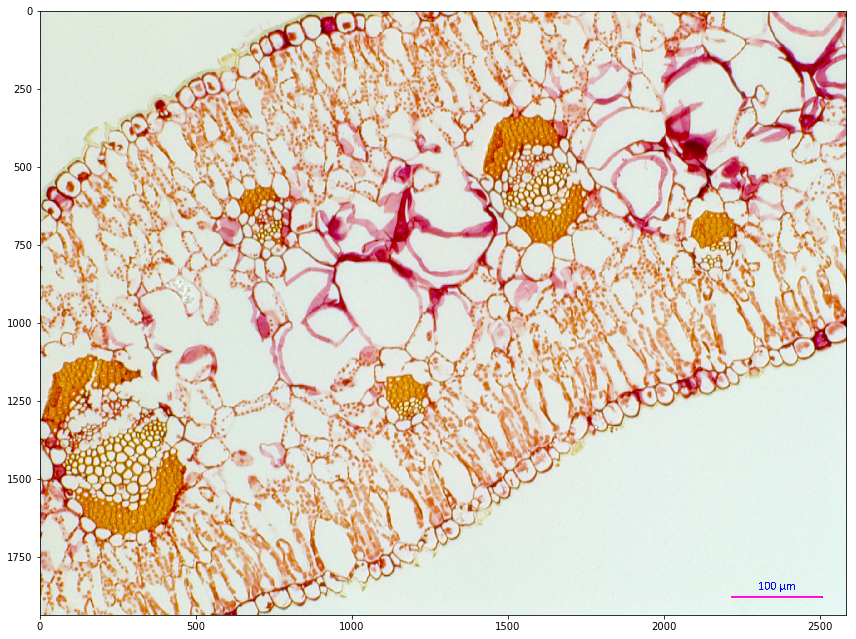

In [509]:
# Draw the lines on the  image
lines_edges = cv2.addWeighted(src1=image.copy(), alpha=1.0, src2=line_image.copy(), beta=10, gamma=0)

fig, ax = plt.subplots(figsize=(12,12))
ax.imshow(lines_edges.copy())
plt.tight_layout()

In [510]:
scalebar = None
scalebar_length = 0.0

for l in lines:
    x1 = l[0][0]
    x2 = l[0][2]
    y1 = l[0][1]
    y2 = l[0][3]
    
    length = np.sqrt((x2-x1)**2+(y2-y1)**2)
        
    if length>scalebar_length:
        scalebar_length = length
        scalebar = l[0]

    print(scalebar, scalebar_length)

[2215 1874 2503 1874] 288.0
[2215 1874 2503 1874] 288.0


Currently I'm often recovering multiple lines when I detect these scale bars. For now I'm resolving this issue by taking the longer one because it is the one that's correct for these images, but something safer will have to be implemented in the future.

In [539]:
def px2area(scalebar, scalebar_img):
    """Reads the units and metric of scale bar from an image and uses the number
    of pixels in the scale bar to convert pixel area to units detected in the image.
    
    Parameters
    ----------
    scalebar : <list>, Scale bar endpoints [x1, y1, x2, y2]
    scarebar_img : <numpy.ndarray>, Image of scale bar
    
    Returns
    -------
    pixel_area : <float>, The area of a single pixel in the new units
    converstion_units : <str>, The detected units"""
    
    scalebar_pixels = np.sqrt((scalebar[2]-scalebar[0])**2+(scalebar[3]-scalebar[1])**2)
    
    scalebar_length, scalebar_units = image_to_string(image=scalebar_img.copy()).split()
    scalebar_length = float(scalebar_length)
    
    pixel_area = (scalebar_length**2)/(scalebar_pixels**2)
    converstion_units = "{}^2".format(scalebar_units)
    
    return pixel_area, converstion_units

The function above calls `image_to_string` from `pytesseract`, which, if the scale of the letters to image size is not correct, will not find any text. In this case, `px2area` returns nothing and the image used needs to be rescaled. The `while` loop with `try`/`except` blocks corrects for this and will try to zoom out of the scale bar until it is readable. One problem I'm still having is reading a mix of languages. Depending on the image, I return `u` or `p` for $\mu$. This could be a problem if, for example, picometers are used. Chaning the detection language to Greek allows me to capture the $\mu$, but then `m` is returns as some other Greek letters. Maybe a detection in both languages followed by some sort of merge/consensus will fix the problem.

foo
foo
0.12056327160493827 pm^2


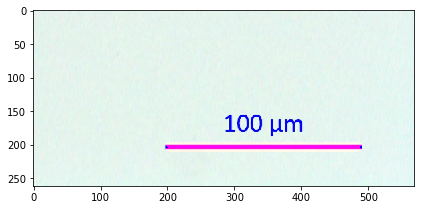

In [540]:
pad = 50
while pad <= max(height, width):
    try: 
        xmin = scalebar[0]
        xmax = scalebar[2]
        ymin = scalebar[1]
        ymax = scalebar[3]
        crop_scalebar = lines_edges.copy()[max([0, ymin-pad]):min([height, ymax+pad]), 
                                     max([0, xmin-pad]):min([width, xmax+pad])]
        conversion_factor, units = px2area(scalebar=scalebar, scalebar_img=crop_scalebar.copy())
        print(conversion_factor, units)
        break
    except ValueError:
        print("foo")
        pad = pad*2

fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(crop_scalebar.copy())
plt.tight_layout()

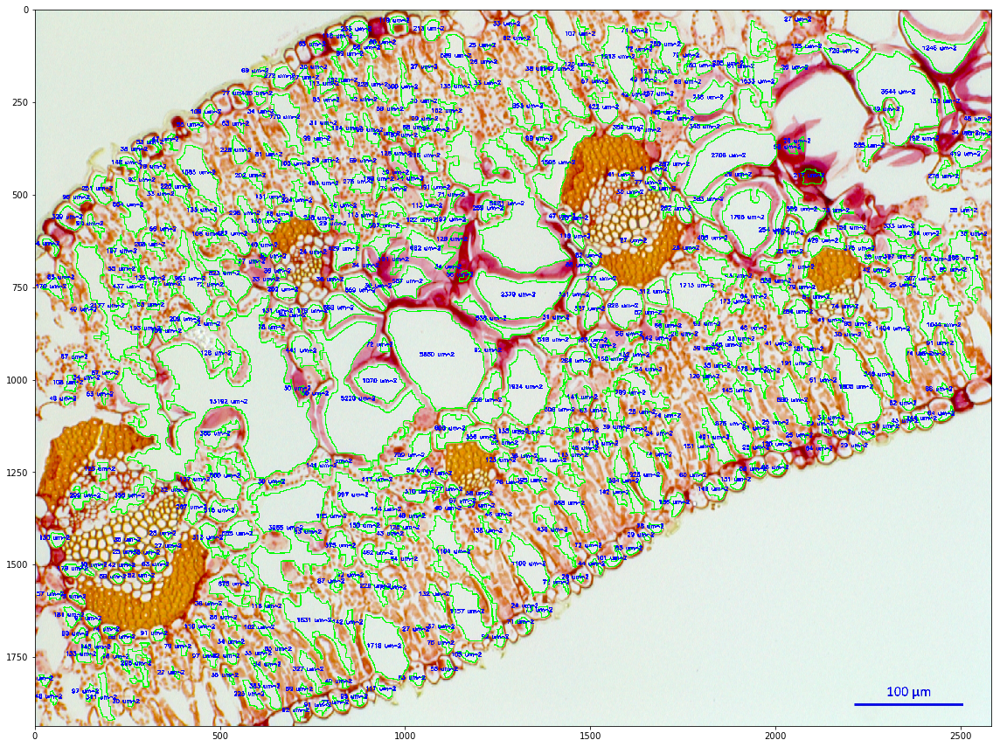

In [541]:
fig, ax = plt.subplots(figsize=(16,16))
mirror_image = image.copy()
# loop over the contours
for i,c in enumerate(contours):
    # Skip small contours
    if cv2.contourArea(c) < 200: 
        continue
    # Calculate area
    c_area_metric = np.round(conversion_factor*cv2.contourArea(c), decimals=1)
    
    # compute the center of the contour, then detect the name of the
    # shape using only the contour
    M = cv2.moments(c)
    cX = int((M["m10"] / M["m00"]))-50
    cY = int((M["m01"] / M["m00"]))

    # multiply the contour (x, y)-coordinates by the resize ratio,
    # then draw the contours and the name of the shape on the image
    c = c.astype("float")
    c = c.astype("int")
    cv2.drawContours(mirror_image, [c], -1, (0, 255, 0), 2)
    cv2.putText(img=mirror_image, text="{} um^2".format(int(c_area_metric)), org=(cX, cY), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0, 0, 255), thickness=2)
    
    # show the output image
ax.imshow(mirror_image)
plt.tight_layout()

As can be seen from the image above, we're almost exclusively measure air space in this image.

## Creating the image processing function.
The function `process_crosssection` is a prototype for what will be the entire top-to-bottom image processing pipeline. There are tons of issues to work out, but I want to get some data to Jon so that he can start doing some learning/classification of the contours. In the end I think we'll want a more modular and flexible approach.

In [542]:
def process_crosssection(image_path, k_blur=5, sigma_blur=2, C_thresh=3, blocksize_thresh=15,
                         k_laplacian=7, k_gradient=2, min_c_area=500,
                         detect_scarebar=False, savefigs=False, output_dir=os.getcwd(), figsize=(12,12)):
    """This function goes through the entire image processing pipeline of this notebook.
    
    Parameters
    ----------
    image_path : <str>, Path to image
    k_blur : <int>, Kernel size in pixels for blurring in pizels, must be odd. Default=5
    sigma_blur : <int>, Gaussian blur standard deviation in pixels. Default=2
    C_thresh : <int>, Constant subtracted from the mean or weighted mean. Default=3
    blocksize_thresh : <int>, Neighborhood size in pixel for calculating threshold, must be odd. Default=15
    k_laplacian : <int>, Kernel size in pixels for Laplacian in pizels, must be odd. Default=7
    k_gradient : <int>, Kernel size in pixels for gradient in pizels. Default=2
    min_c_area : <int>, Minimum contour size in pixels. Default=500
    detect_scarebar : <bool>, Attempt to detect image scale bar. Only works line-line
        scale bars. Does not work with ruler-like scale bars. Default=False
    savefigs : <bool>, Saves images at each step of processing. Default=False
    output_dir : <str>, Path to desired output directory. Default is current working directory.
    figsize : <tuple>, Size of output figures. Default=(12,12)
    """

    if not os.path.exists(output_dir): os.makedirs(output_dir)
    
    """0. Original"""
    image = cv2.imread(image_path)
    image_name = os.path.basename(image_path)
    height, width = image.shape[:2]
    
    """Convert to BGR"""
    BGR = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2BGR)

    """1. Gray"""
    gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(gray.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.01gray.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """2. Blur"""
    blur = cv2.GaussianBlur(src=gray.copy(), ksize=(k_blur, k_blur), sigmaX=sigma_blur)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(blur.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.02blur.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """3. Adaptive Gaussian threshold"""
    thresh = cv2.adaptiveThreshold(src=blur.copy(), maxValue=255, adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   thresholdType=cv2.THRESH_BINARY, blockSize=blocksize_thresh, C=C_thresh)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(thresh.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.03thresh.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """4. Laplacian"""
    laplacian = cv2.Laplacian(src=thresh.copy(), ddepth=cv2.CV_16S, ksize=k_laplacian)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(laplacian.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.04laplacian.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """5. Morphological gradient"""
    kernel = cv2.getStructuringElement(shape=cv2.MORPH_RECT, ksize=(k_gradient, k_gradient))
    gradient = cv2.morphologyEx(laplacian.copy(), cv2.MORPH_GRADIENT, kernel=kernel, iterations=3)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(gradient.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.05gradient.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """6. Binarize gradient"""
    binary = cv2.inRange(gradient.copy(), lowerb=np.array([0]), upperb=np.array([5]))
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(binary.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.06binary.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """Flood fill from the edges"""
    for row in range(height):
        if binary[row, 0] == 255:
            cv2.floodFill(binary, None, (0, row), 0)
        if binary[row, width-1] == 255:
            cv2.floodFill(binary, None, (width-1, row), 0)
    for col in range(width):
        if binary[0, col] == 255:
            cv2.floodFill(binary, None, (col, 0), 0)
        if binary[height-1, col] == 255:
            cv2.floodFill(binary, None, (col, height-1), 0)
    
    """7. Cleaning up mask: open forereground"""
    foreground_open = cv2.morphologyEx(binary.copy(), cv2.MORPH_OPEN, kernel=kernel, iterations=1)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(foreground_open.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.07foreground_open.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """8. Cleaning up mask: close forereground"""
    foreground_closed = cv2.morphologyEx(foreground_open.copy(), cv2.MORPH_CLOSE, kernel=kernel, iterations=1)
    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        plt.imshow(foreground_closed.copy(), cmap="gray")
        plt.savefig(os.path.join(output_dir, "{}.08foreground_closed.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """9. Process contours"""
    contours, hierarchy = cv2.findContours(image=foreground_closed.copy(), mode=cv2.RETR_EXTERNAL, 
                                       method=cv2.CHAIN_APPROX_SIMPLE)
    # Extract large contours
    large_contours = [c for c in contours if cv2.contourArea(c) >= min_c_area]

    if savefigs:
        fig, ax = plt.subplots(figsize=figsize)
        drawn_contours = cv2.drawContours(image=image.copy(), contours=large_contours, 
                                  contourIdx=-1, color=(0,255,0), thickness=3)
        plt.imshow(drawn_contours.copy())        
        plt.savefig(os.path.join(output_dir, "{}.09draw_contours.png".format(image_name)), dpi=100, transparent=True)
        plt.close()
    """Scalebar detection"""
    if detect_scarebar:
        rho = 1  # distance resolution in pixels of the Hough grid
        theta = np.pi / 180  # angular resolution in radians of the Hough grid
        threshold = 15  # minimum number of votes (intersections in Hough grid cell)
        min_line_length = 100  # minimum number of pixels making up a line
        max_line_gap = 0  # maximum gap in pixels between connectable line segments
        line_image = image.copy()*0  # creating a blank to draw lines on
        edges = cv2.Canny(blur.copy(), threshold1=50, threshold2=150)

        # Run Hough on edge detected image
        # Output "lines" is an array containing endpoints of detected line segments
        lines = cv2.HoughLinesP(image=edges.copy(), rho=rho, theta=theta, threshold=threshold, 
                                lines=np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)
        lines_edges = cv2.addWeighted(src1=image.copy(), alpha=1.0, src2=line_image.copy(), beta=10, gamma=0)

        for line in lines:
            for x1,y1,x2,y2 in line: cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)
                
        # Find longest scalebar
        scalebar = None
        scalebar_length = 0.0
        for l in lines:
            x1, x2, y1, y2 = l[0][0], l[0][2], l[0][1], l[0][3]
            length = np.sqrt((x2-x1)**2+(y2-y1)**2)
        
            if length>scalebar_length:
                scalebar_length = length
                scalebar = l[0]
        
        pad=50    
        while pad <= max(height, width):
            try: 
                xmin, xmax, ymin, ymax = scalebar[0], scalebar[2], scalebar[1], scalebar[3]
                crop_scalebar = lines_edges.copy()[max([0, ymin-pad]):min([height, ymax+pad]), 
                                                   max([0, xmin-pad]):min([width, xmax+pad])]
                # Convert pixels to area and measure
                conversion_factor, units = px2area(scalebar=scalebar, scalebar_img=crop_scalebar.copy())
                contour_areas_pixels = [cv2.contourArea(c) for c in large_contours]
                contour_areas_metric = [c*conversion_factor for c in contour_areas_pixels]
                break
            except ValueError:
                pad = pad*2

        if savefigs:
            fig, ax = plt.subplots(figsize=(figsize[0]/3, figsize[1]/3))
            plt.imshow(crop_scalebar.copy())
            plt.savefig(os.path.join(output_dir, "{}.10scalebar.png".format(image_name)), dpi=100, transparent=True)
            plt.close()
                       
        if savefigs:
            fig, ax = plt.subplots(figsize=figsize)
            mirror_image = image.copy()
            for i, c in enumerate(large_contours):
                # compute the center of contour
                M = cv2.moments(c)
                cX = int((M["m10"] / M["m00"]))-50
                cY = int((M["m01"] / M["m00"]))
                cv2.drawContours(mirror_image, [c], -1, (0, 255, 0), 2)
                cv2.putText(img=mirror_image, text="{} um^2".format(int(contour_areas_metric[i])), org=(cX, cY), 
                            fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0, 0, 255), thickness=2)
            ax.imshow(mirror_image)
            plt.savefig(os.path.join(output_dir, "{}.11with_measurements.png".format(image_name)), dpi=200, transparent=True)
            plt.close()
            fig, ax = plt.subplots(figsize=figsize)
            mirror_image = image.copy()
            for i, c in enumerate(large_contours):
                # compute the center of contour
                M = cv2.moments(c)
                cX = int((M["m10"] / M["m00"]))
                cY = int((M["m01"] / M["m00"]))
                cv2.drawContours(mirror_image, [c], -1, (0, 255, 0), 2)
                cv2.putText(img=mirror_image, text="{}".format(i), org=(cX, cY), 
                            fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0, 0, 255), thickness=2)

                # show the output image
            ax.imshow(mirror_image)
            plt.savefig(os.path.join(output_dir, "{}.12with_index.png".format(image_name)), dpi=200, transparent=True)
            plt.close()
    DF = pd.DataFrame()
    DF["contour"] = large_contours
    DF["area_pixels"] = contour_areas_pixels
    if detect_scarebar: DF["area_um"] = contour_areas_metric
    DF["image"] = image_name               
    DF.to_pickle(os.path.join(output_dir, "{}.contour_data.pkl".format(image_name)))

As mentioned above, the code below is just to generate some preliminary data. I've commented out the big function `process_crosssection` because it takes a little time when run over many images and currently overwrites all previous data.

In [543]:
for image_path in glob(os.path.join("../Data/C3_images/", "*.jpg")):
    print(image_path)
    process_crosssection(image_path=image_path, detect_scarebar=True, 
                     savefigs=True, output_dir=os.path.join("../Results", os.path.basename(image_path)))

../Data/C3_images\1.1_10x.jpg
../Data/C3_images\1.3_10x.jpg
../Data/C3_images\2.1_10x.jpg
../Data/C3_images\2.2_10x.jpg
../Data/C3_images\20.1_10x.jpg
../Data/C3_images\20.2_10x.jpg
../Data/C3_images\25.1_10x.jpg
../Data/C3_images\25.2_10x.jpg
../Data/C3_images\3.1_10x.jpg
../Data/C3_images\3.2_10x.jpg
../Data/C3_images\33.1_10x_D.jpg
../Data/C3_images\33.2_10x_D.jpg
../Data/C3_images\38.2_10x.jpg
../Data/C3_images\38.3_10x.jpg
../Data/C3_images\4_10x_1.jpg
../Data/C3_images\4_10x_2.jpg
../Data/C3_images\5_10x_1.jpg
../Data/C3_images\5_10x_2.jpg


## Detecting a ruler
Detecting the scale bar above was pretty easy because it's a simple, solid line. However, some researchers instead choose to take images of a ruler under the same magnification that they are imaging material.

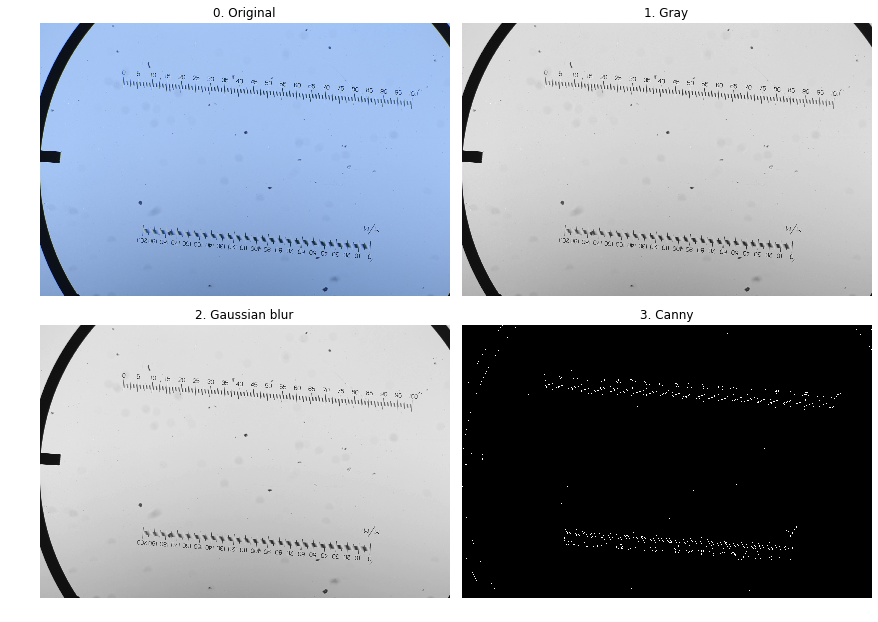

In [27]:
"""0. Original"""
image = cv2.imread("../Data/Calindrinia/4x_scale.JPG")
height, width = image.shape[:2]

"""Convert to BGR"""
BGR = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2BGR)

"""1. Gray"""
gray = cv2.cvtColor(src = image.copy(), code=cv2.COLOR_RGB2GRAY)

"""2. Blur"""
# Kernel size for blurring in pizels
k_blur = 3
blur = cv2.GaussianBlur(src=gray.copy(), ksize=(k_blur, k_blur), sigmaX=2)

"""3. Canny"""
edges = cv2.Canny(blur.copy(), threshold1=50, threshold2=150)

# Plotting
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12,12))
ax[0,0].imshow(image)
ax[0,0].set_title("0. Original")

ax[0,1].imshow(gray, cmap="gray")
ax[0,1].set_title("1. Gray")

ax[1,0].imshow(blur, cmap="gray")
ax[1,0].set_title("2. Gaussian blur")

ax[1,1].imshow(edges, cmap="gray")
ax[1,1].set_title("3. Canny")

for i in range(2):
    for j in range(2):
        ax[i,j].axis("off")
plt.tight_layout(pad=0.0, h_pad=-20.0, w_pad=-2.0)

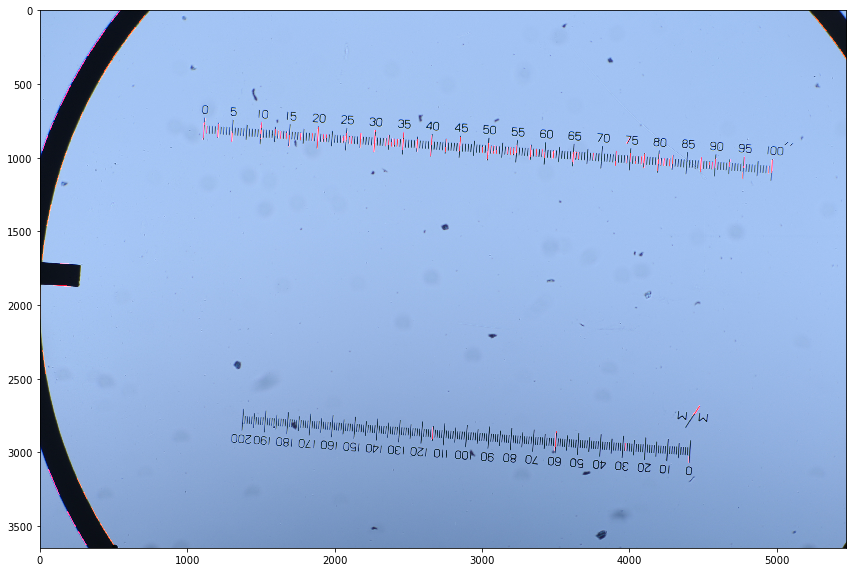

In [28]:
rho = 2  # distance resolution in pixels of the Hough grid
theta = np.pi / 180  # angular resolution in radians of the Hough grid
threshold = 2  # minimum number of votes (intersections in Hough grid cell)
min_line_length = 40  # minimum number of pixels making up a line
max_line_gap = 5  # maximum gap in pixels between connectable line segments
line_image = image.copy()*0  # creating a blank to draw lines on

# Run Hough on edge detected image
# Output "lines" is an array containing endpoints of detected line segments
lines = cv2.HoughLinesP(image=edges.copy(), rho=rho, theta=theta, threshold=threshold, 
                        lines=np.array([]), minLineLength=min_line_length, maxLineGap=max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

# Draw the lines on the  image
lines_edges = cv2.addWeighted(src1=image.copy(), alpha=1.0, src2=line_image.copy(), beta=10, gamma=0)

fig, ax = plt.subplots(figsize=(12,12))
ax.imshow(lines_edges.copy())
plt.tight_layout()

### Using `tkinter` to get positions
The goal of this section is to build a point-and-click GUI for users to add and measure their own scale bars.

In [29]:
from tkinter import *
import tkinter as tk
import PIL.ImageTk
import tkinter.simpledialog
import cv2
%gui tk

In [30]:
#function to be called when mouse is clicked
def printcoords(event):
    #outputting x and y coords to console
    coords = []
    while len(coords)<=2:
        coords.append([event.x, event.y])
    return coords

In [31]:
ruler = "../Data/Calindrinia/4x_scale.JPG"
height, width = cv2.imread("../Data/Calindrinia/4x_scale.JPG").shape[:2]

root = tk.Toplevel()

#setting up a tkinter canvas with scrollbars
frame = tk.Frame(root, bd=2, relief=tk.SUNKEN)
frame.grid_rowconfigure(0, weight=1)
frame.grid_columnconfigure(0, weight=1)
xscroll = tk.Scrollbar(frame, orient=tk.HORIZONTAL)
xscroll.grid(row=1, column=0, sticky=tk.E+tk.W)
yscroll = tk.Scrollbar(frame)
yscroll.grid(row=0, column=1, sticky=tk.N+tk.S)
canvas = tk.Canvas(frame, bd=0, xscrollcommand=xscroll.set, yscrollcommand=yscroll.set)
canvas.grid(row=0, column=0, sticky=tk.N+tk.S+tk.E+tk.W)
xscroll.config(command=canvas.xview)
yscroll.config(command=canvas.yview)
frame.pack(fill=tk.BOTH, expand=1)

#adding the image
photo = PIL.ImageTk.PhotoImage(PIL.Image.open(ruler))
canvas.create_image(0,0,image=photo,anchor="nw")
canvas.config(scrollregion=canvas.bbox(tk.ALL))


#mouseclick event
canvas.bind("<Button 1>", printcoords)

root.mainloop()

In [32]:
ruler = "../Data/Calindrinia/4x_scale.JPG"
height, width = cv2.imread("../Data/Calindrinia/4x_scale.JPG").shape[:2]

root = Tk()  
canvas = Canvas(root, width = width, height = height)  
canvas.pack()  
img = PIL.ImageTk.PhotoImage(PIL.Image.open(ruler))  
canvas.create_image(20, 20, anchor=NW, image=img)  
root.mainloop()  